### This file contains a melting pot of steps to take in order to prepare the data for a bike frequency map. You can reuse this receipe to make any bike frequency map. Perhaps even a scooter frequency map, a dog walking frequency map...


In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as pl
import json
import folium
from shapely.geometry import LineString

### I. Import main files. 
#### I am using data of individual recorded bike trips using an application called ["Montreal Trajet"](https://donnees.montreal.ca/dataset/mtl-trajet). The bike individual bike trips will be eventually spatial join on top of [Montreal Main Route](https://donnees.montreal.ca/dataset/geobase) 

In [2]:
new_bike_trip = gpd.read_file('bike_trip_shp_2/trajets_mtl_velo.shp')
new_bike_trip.head()

,id_trip,mode,purpose,starttime,endtime,Shape_Leng,geometry
0,17106,Vélo,Travail / Rendez-vous d'affaires,2017-09-18 11:44:21UTC,2017-09-18 12:27:02UTC,0.159329,"MULTILINESTRING ((-73.52568 45.59988, -73.5257..."
1,328570,Vélo,Travail / Rendez-vous d'affaires,2017-09-18 11:51:02UTC,2017-09-18 12:20:33UTC,0.063000,"LINESTRING (-73.53301 45.55240, -73.53309 45.5..."
2,383924,Vélo,Travail / Rendez-vous d'affaires,2017-09-18 12:06:51UTC,2017-09-18 12:43:36UTC,0.074623,"LINESTRING (-73.59837 45.53642, -73.59847 45.5..."
3,172321,Vélo,Travail / Rendez-vous d'affaires,2017-09-18 12:08:14UTC,2017-09-18 12:38:22UTC,0.054991,"LINESTRING (-73.57530 45.53738, -73.57492 45.5..."
4,418186,Vélo,Travail / Rendez-vous d'affaires,2017-09-18 12:20:27UTC,2017-09-18 12:43:57UTC,0.084788,"LINESTRING (-73.53023 45.55660, -73.53040 45.5..."


In [3]:
geobase = pd.read_json('geobase.json')
geobase.head()

,type,name,features
0,FeatureCollection,geobase_mtl,"{'type': 'Feature', 'geometry': {'type': 'Line..."
1,FeatureCollection,geobase_mtl,"{'type': 'Feature', 'geometry': {'type': 'Line..."
2,FeatureCollection,geobase_mtl,"{'type': 'Feature', 'geometry': {'type': 'Line..."
3,FeatureCollection,geobase_mtl,"{'type': 'Feature', 'geometry': {'type': 'Line..."
4,FeatureCollection,geobase_mtl,"{'type': 'Feature', 'geometry': {'type': 'Line..."


#### I.I Convert the json from the street network into a shapefile and make sure that they are in the same projection. 
##### Here I am using [epsg=4326](https://epsg.io/4326)

In [4]:
# Load JSON file as a string
with open('geobase.json') as f:
    json_data = json.load(f)

# Convert JSON to GeoDataFrame
geobase_gdf = gpd.GeoDataFrame.from_features(json_data['features'])

# Save as SHP file
geobase_gdf.to_file('output.shp', driver='ESRI Shapefile')

In [4]:
geobase = gpd.read_file('output.shp')
bike_trip_new = gpd.read_file('bike_trip_shp_2/trajets_mtl_velo.shp')

geobase_mtm8= geobase.set_crs(epsg=4326, allow_override=True)
bike_trip_new_mtm8= bike_trip_new.set_crs(epsg=4326, allow_override=True)

##### Visualize the data and check for data type 

In [6]:
geobase_mtm8.head()

,ID_TRC,DEB_GCH,FIN_GCH,ARR_GCH,SENS_CIR,CLASSE,LIE_VOIE,TYP_VOIE,DIR_VOIE,NOM_VOIE,DEB_DRT,FIN_DRT,ARR_DRT,LIM_GCH,LIM_DRT,geometry
0,1010001,12320,12340,Ahuntsic-Cartierville,0,0,None,avenue,None,Adhémar-Mailhiot,12323,12335,Ahuntsic-Cartierville,Montréal,Montréal,"LINESTRING (-73.74080 45.51896, -73.74087 45.5..."
1,1010004,5530,5570,Ahuntsic-Cartierville,0,0,None,place,None,D'Aiguillon,5475,5625,Ahuntsic-Cartierville,Montréal,Montréal,"LINESTRING (-73.70624 45.52765, -73.70629 45.5..."
2,1010005,7750,7830,Ahuntsic-Cartierville,0,0,None,avenue,None,Albert-LeSage,7745,7805,Ahuntsic-Cartierville,Montréal,Montréal,"LINESTRING (-73.73715 45.52446, -73.73721 45.5..."
3,1010006,12200,12238,Ahuntsic-Cartierville,0,0,None,avenue,None,Albert-Prévost,0,0,Ahuntsic-Cartierville,Montréal,Montréal,"LINESTRING (-73.73587 45.52119, -73.73593 45.5..."
4,1010007,12240,12270,Ahuntsic-Cartierville,0,0,None,avenue,None,Albert-Prévost,0,0,Ahuntsic-Cartierville,Montréal,Montréal,"LINESTRING (-73.73661 45.52166, -73.73668 45.5..."


In [11]:
type(geobase_mtm8)

geopandas.geodataframe.GeoDataFrame

In [5]:
bike_trip_new_mtm8.head()

,id_trip,mode,purpose,starttime,endtime,Shape_Leng,geometry
0,17106,Vélo,Travail / Rendez-vous d'affaires,2017-09-18 11:44:21UTC,2017-09-18 12:27:02UTC,0.159329,"MULTILINESTRING ((-73.52568 45.59988, -73.5257..."
1,328570,Vélo,Travail / Rendez-vous d'affaires,2017-09-18 11:51:02UTC,2017-09-18 12:20:33UTC,0.063000,"LINESTRING (-73.53301 45.55240, -73.53309 45.5..."
2,383924,Vélo,Travail / Rendez-vous d'affaires,2017-09-18 12:06:51UTC,2017-09-18 12:43:36UTC,0.074623,"LINESTRING (-73.59837 45.53642, -73.59847 45.5..."
3,172321,Vélo,Travail / Rendez-vous d'affaires,2017-09-18 12:08:14UTC,2017-09-18 12:38:22UTC,0.054991,"LINESTRING (-73.57530 45.53738, -73.57492 45.5..."
4,418186,Vélo,Travail / Rendez-vous d'affaires,2017-09-18 12:20:27UTC,2017-09-18 12:43:57UTC,0.084788,"LINESTRING (-73.53023 45.55660, -73.53040 45.5..."


In [13]:
type(bike_trip_new_mtm8)

geopandas.geodataframe.GeoDataFrame

### II. Create a buffer around the bike trip data 

In [6]:
# Create a buffer of 10 meters around the polyline using an approximate conversion factor :
# give a buffer size
approx_factor = 1/111111.0 # 1 degree of latitude is approximately 111,111 meters. so for 10m --> 
buffer_size = 10 * approx_factor
# Create a buffered GeoSeries
new_bike_trip_mtm8_buffered = bike_trip_new_mtm8.geometry.buffer(buffer_size) ##buffering around the bike_trip_mtm8
new_bike_trip_mtm8_buffered = new_bike_trip_mtm8_buffered.to_crs(epsg=4326)
# Convert the buffered GeoSeries to a GeoDataFrame
bt_mtm8_buffered_gdf = gpd.GeoDataFrame(geometry=new_bike_trip_mtm8_buffered, crs='EPSG:4326')

/tmp/ipykernel_1188/266239838.py:6: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  new_bike_trip_mtm8_buffered = bike_trip_new_mtm8.geometry.buffer(buffer_size) ##buffering around the bike_trip_mtm8


In [25]:
type(bt_mtm8_buffered_gdf)

geopandas.geodataframe.GeoDataFrame

In [6]:
bt_mtm8_buffered_gdf.head()

,geometry
0,"MULTIPOLYGON (((-73.52638 45.59846, -73.52617 ..."
1,"POLYGON ((-73.56783 45.50896, -73.56787 45.508..."
2,"POLYGON ((-73.59892 45.53570, -73.59876 45.535..."
3,"POLYGON ((-73.57555 45.52825, -73.57553 45.528..."
4,"POLYGON ((-73.56706 45.50984, -73.56699 45.509..."


In [8]:
# use assign method to create a new column in bt_mtm8_buffered_gdf by computing values based on existing column id_trip
bt_mtm8_buf_gdf = bt_mtm8_buffered_gdf.assign(id_bike_trip=bike_trip_new_mtm8['id_trip'])
bt_mtm8_buf_gdf.head()

,geometry,id_bike_trip
0,"MULTIPOLYGON (((-73.52638 45.59846, -73.52617 ...",17106
1,"POLYGON ((-73.56783 45.50896, -73.56787 45.508...",328570
2,"POLYGON ((-73.59892 45.53570, -73.59876 45.535...",383924
3,"POLYGON ((-73.57555 45.52825, -73.57553 45.528...",172321
4,"POLYGON ((-73.56706 45.50984, -73.56699 45.509...",418186


<AxesSubplot: >

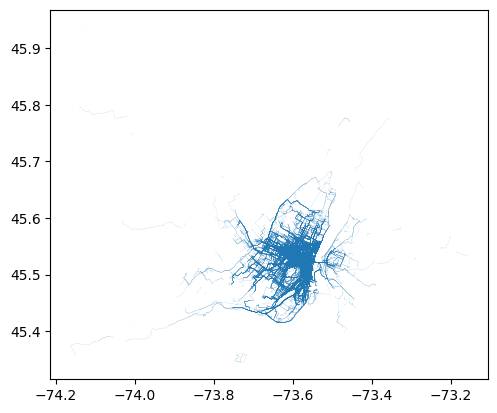

In [9]:
#Verify what the buffer looks like 
bt_mtm8_buf_gdf.plot()

### III. Spatial join the buffer to the geobase 

In [10]:
new_bike_trips_by_road = gpd.sjoin(bt_mtm8_buf_gdf, geobase_mtm8, op='contains')
## Remove the highways 
to_remove = new_bike_trips_by_road[new_bike_trips_by_road['TYP_VOIE'] != 'autoroute']
to_remove.head()

/home/thebreadinbed/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3382: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


,geometry,id_bike_trip,index_right,ID_TRC,DEB_GCH,FIN_GCH,ARR_GCH,SENS_CIR,CLASSE,LIE_VOIE,TYP_VOIE,DIR_VOIE,NOM_VOIE,DEB_DRT,FIN_DRT,ARR_DRT,LIM_GCH,LIM_DRT
0,"MULTIPOLYGON (((-73.52638 45.59846, -73.52617 ...",17106,33196,1625139,0,0,Le Sud-Ouest,-1,5,des,chemin,None,Moulins,0,0,Le Sud-Ouest,Montréal,Montréal
2235,"MULTIPOLYGON (((-73.52789 45.58136, -73.52775 ...",140803,33196,1625139,0,0,Le Sud-Ouest,-1,5,des,chemin,None,Moulins,0,0,Le Sud-Ouest,Montréal,Montréal
0,"MULTIPOLYGON (((-73.52638 45.59846, -73.52617 ...",17106,14854,1600187,0,0,Le Sud-Ouest,0,0,des,chemin,None,Moulins,0,0,Le Sud-Ouest,Montréal,Montréal
23,"POLYGON ((-73.55412 45.51688, -73.55396 45.516...",24339,14854,1600187,0,0,Le Sud-Ouest,0,0,des,chemin,None,Moulins,0,0,Le Sud-Ouest,Montréal,Montréal
2235,"MULTIPOLYGON (((-73.52789 45.58136, -73.52775 ...",140803,14854,1600187,0,0,Le Sud-Ouest,0,0,des,chemin,None,Moulins,0,0,Le Sud-Ouest,Montréal,Montréal


#### Group by ID_TRC 

In [11]:
# Group by the street network section and count the number of trips
new_trips_by_trc = to_remove.groupby('ID_TRC').size().reset_index(name='num_trips')
new_trips_by_trc.head()

,ID_TRC,num_trips
0,1010074,4
1,1010075,5
2,1010076,4
3,1010077,4
4,1010078,4


In [12]:
# merge the street network to the newly grouped data by ID_TRC to have an ID_TRC and number of trips corresponding to a NOM_VOIE(name of street) 
new_merged_table = pd.merge(geobase_mtm8 , new_trips_by_trc, on='ID_TRC')
new_merged_table.head()

,ID_TRC,DEB_GCH,FIN_GCH,ARR_GCH,SENS_CIR,CLASSE,LIE_VOIE,TYP_VOIE,DIR_VOIE,NOM_VOIE,DEB_DRT,FIN_DRT,ARR_DRT,LIM_GCH,LIM_DRT,geometry,num_trips
0,1010074,5460,5462,Ahuntsic-Cartierville,0,0,du,rue,None,Bocage,5411,5487,Ahuntsic-Cartierville,Montréal,Montréal,"LINESTRING (-73.71838 45.53578, -73.71843 45.5...",4
1,1010075,0,0,Ahuntsic-Cartierville,-1,0,du,rue,None,Bocage,0,0,Ahuntsic-Cartierville,Montréal,Montréal,"LINESTRING (-73.71946 45.53449, -73.71951 45.5...",5
2,1010076,0,0,Ahuntsic-Cartierville,-1,0,du,rue,None,Bocage,5781,5791,Ahuntsic-Cartierville,Montréal,Montréal,"LINESTRING (-73.72018 45.53391, -73.72023 45.5...",4
3,1010077,5830,5832,Ahuntsic-Cartierville,-1,0,du,rue,None,Bocage,5835,5837,Ahuntsic-Cartierville,Montréal,Montréal,"LINESTRING (-73.72093 45.53332, -73.72098 45.5...",4
4,1010078,5860,5876,Ahuntsic-Cartierville,-1,0,du,rue,None,Bocage,5855,5877,Ahuntsic-Cartierville,Montréal,Montréal,"LINESTRING (-73.72169 45.53273, -73.72247 45.5...",4


In [16]:
# Convert DataFrame to GeoDataFrame
new_gdf = gpd.GeoDataFrame(new_merged_table, geometry='geometry', crs='EPSG:4326')
# Set the active geometry column
new_gdf = new_gdf.set_geometry('geometry')

<AxesSubplot: >

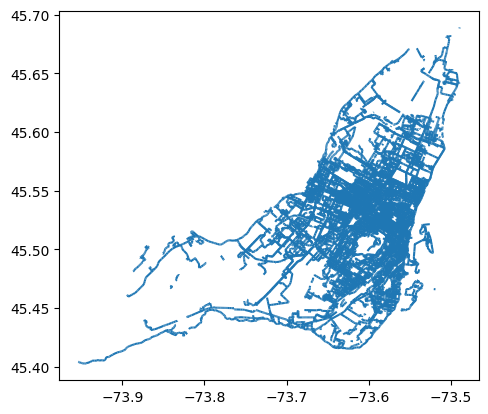

In [17]:
new_gdf.plot()

In [18]:
type(new_gdf)

geopandas.geodataframe.GeoDataFrame

#### Group by ID_TRC 

In [20]:
new_grouped_table = new_gdf.groupby("ID_TRC", as_index=False).agg({'geometry': 'first', 'num_trips': 'first'})
new_grouped_table.head()

,ID_TRC,geometry,num_trips
0,1010074,"LINESTRING (-73.71838 45.53578, -73.71843 45.5...",4
1,1010075,"LINESTRING (-73.71946 45.53449, -73.71951 45.5...",5
2,1010076,"LINESTRING (-73.72018 45.53391, -73.72023 45.5...",4
3,1010077,"LINESTRING (-73.72093 45.53332, -73.72098 45.5...",4
4,1010078,"LINESTRING (-73.72169 45.53273, -73.72247 45.5...",4


In [21]:
grouped_table_gdf = gpd.GeoDataFrame(new_grouped_table, geometry='geometry', crs='EPSG:4326')
grouped_table_gdf = grouped_table.set_geometry('geometry') 

In [22]:
grouped_table_gdf.explore(
    column="num_trips",
    cmap="Reds",
    legend=None,
    tooltip=['num_trips'],
    style_kwds={"color": "black", "weight":1, "opacity":0.76} 
)